# Credit Analysis
    a.	Preprocess and clean if necessary.
    b.	Build a model predicting “Risk”. 
    c.	Remember to comment your code and give rationales for models, algorithms, and approaches. 


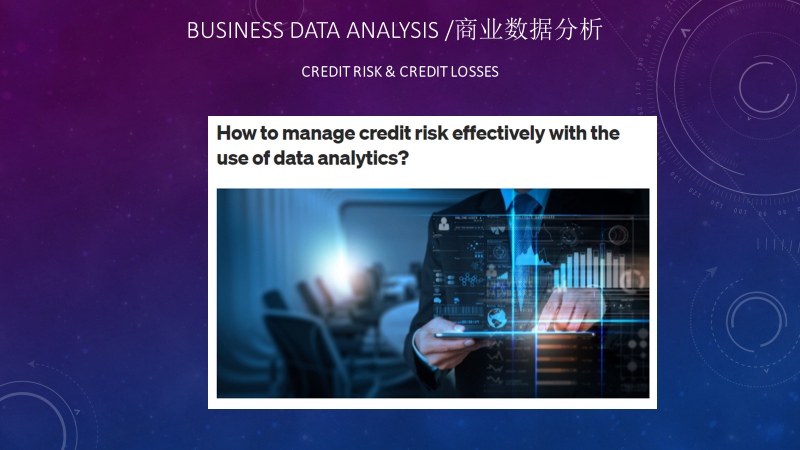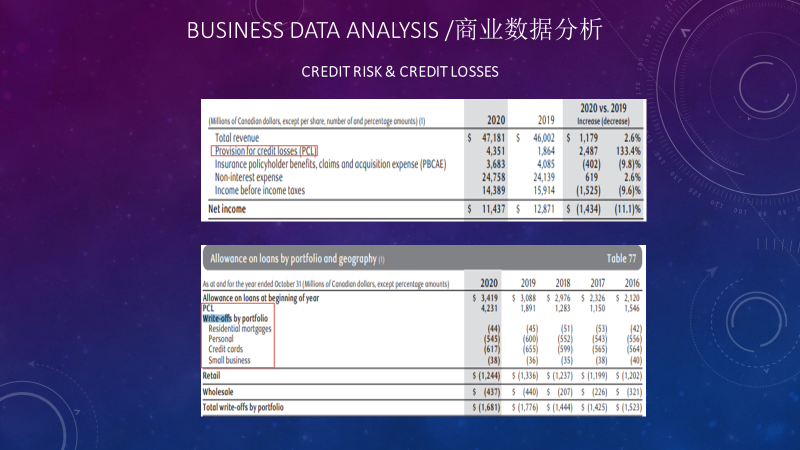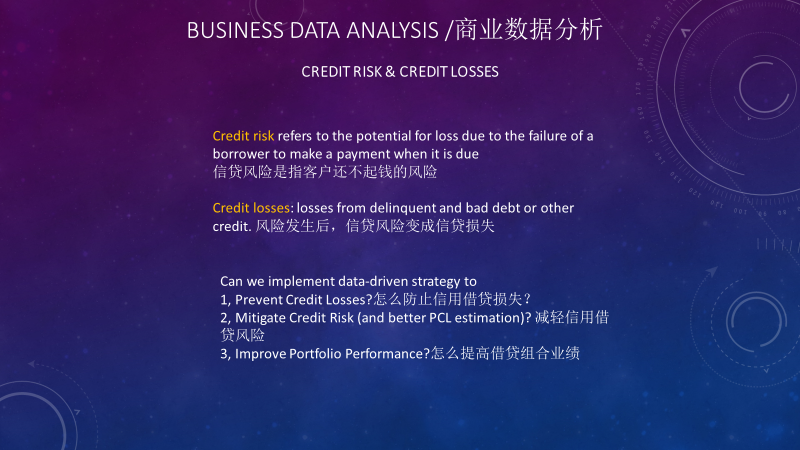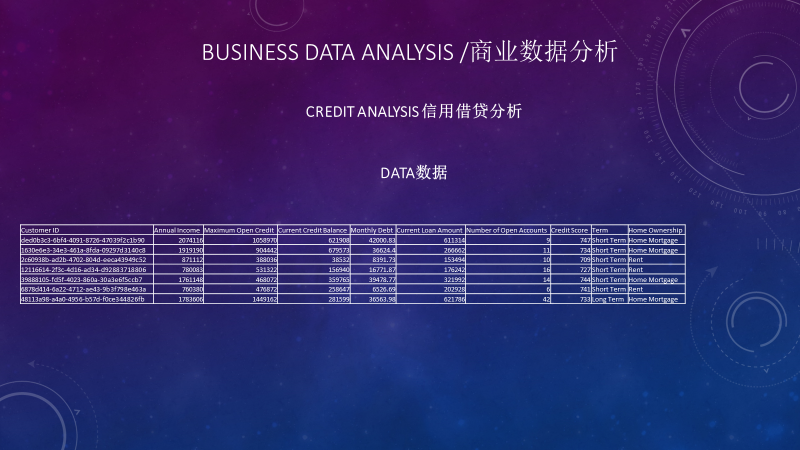

## Import Packages

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
%matplotlib inline

## Load data

In [ ]:
import pyodbc
import urllib
import sqlalchemy

'''connect to datahub'''

params_datahub = urllib.parse.quote_plus("DRIVER={SQL Server Native Client 11.0};"
                                 "SERVER=localhost\SQLEXPRESS;"
                                 "DATABASE=datahub;"
                                 "UID=sa;"
                                 "PWD=user1")

engine_datahub = sqlalchemy.create_engine("mssql+pyodbc:///?odbc_connect={}".format(params_datahub))

In [ ]:
df=pd.read_sql_table(r"credit_train",engine_datahub)
df.head()

## 1, Exploratory Data Analysis(EDA)
1,profiling data
2,understand customers
3,understand products
4,check for data errors


### preliminary Profiling the data

In [ ]:
# %pip install pandas-profiling
from pandas_profiling import ProfileReport
profile = ProfileReport(df)
profile

### Check missing values and shape
Normally we need to clean the samples, i,e, impute missing values but in this case the data is pretty clean with no missing values. We also check the shape to make sure it matches the meta data info in the document. 

In [ ]:
df.info(), df.shape

### Check Loan Status ratio
The samples are balanced so we can use "Accuracy" metric to measure the performance of the model

In [ ]:
df['Loan Status'].value_counts().plot(kind='bar')

### Categorical features/Dimensions 

In [ ]:
cat_cols=df.select_dtypes(object).drop(['Loan ID','Customer ID'],axis=1).columns.tolist()
cat_cols

In [ ]:
import matplotlib.pyplot as plt
categorical_features = cat_cols
# fig, ax = plt.subplots(1, len(categorical_features))
fig, ax = plt.subplots(1, len(categorical_features))
for i, categorical_feature in enumerate(df[categorical_features]):
    df[categorical_feature].value_counts().plot(kind="bar", ax=ax[i],figsize=(20,8),rot=90,fontsize=10).set_title(categorical_feature)
fig.show()

### Numeric features/viarables

#### Histogram
Histogram groups numeric data into bins, displaying the bins as segmented columns and summarize the distribution of a univariate data set. 

In [ ]:
num_cols=df.select_dtypes('number').columns.tolist()
num_cols

In [ ]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
fig, ax = plt.subplots(6, 2, figsize=(20, 20))

for i in range(ax.shape[0]):
    for j in range(ax.shape[1]):
        sns.distplot(df[df[num_cols].columns[i*2+j]], ax=ax[i][j],bins=50)

In [ ]:
df.describe()
# from the "max" row we can see feature PARA_A, PARA_B,Money_Value,History have some potential outliers. 

In [ ]:
df['Credit Score']=np.where(df['Credit Score']>=1000,df['Credit Score']/10,df['Credit Score'])

In [ ]:
df['Current Loan Amount']=np.where(df['Current Loan Amount']==99999999,df['Current Loan Amount'].median(),df['Current Loan Amount'])

In [ ]:
df.describe()

#### Clip, i.e. assigns values outside boundary to boundary values, the data to deal with outliers. 
 Outliers may distort how we see the data. They contain information too so it's a tradeoff; we lose some info but gain a better big picture of the data.

In [ ]:
# here we use quantile 0.01 as lower limit and 0.99 upper.
df[num_cols]=df[num_cols].clip(lower=df[num_cols].quantile(0.01), upper=df[num_cols].quantile(0.99),axis=1)
df.describe()

In [ ]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
fig, ax = plt.subplots(6, 2, figsize=(20, 25))

for i in range(ax.shape[0]):
    for j in range(ax.shape[1]):
        sns.distplot(df[df[num_cols].columns[i*2+j]], ax=ax[i][j],bins=50)

#### Boxplot the data
Boxplot shows the shape of the distribution, its central value, and its variability

In [ ]:
import warnings
warnings.simplefilter(action='ignore', category=UserWarning)

fig, ax = plt.subplots(6, 2, figsize=(15, 25))

#plot the features except LOCATION_ID and Risk
for i in range(ax.shape[0]):
    for j in range(ax.shape[1]):
        sns.boxplot(df[df[num_cols].columns[i*2+j]], ax=ax[i][j],orient='v',showfliers=False)

#### Explain the Boxplots:
The boxplots tell similar story as the Histograms. None of the distributions seem normal.

# 2,looking for relationships

## Numerical vs Numerical
Correlation heatmap allows us to see relations between features/attributes. The higher the absolute coefficient, the stronger the correlation is. 

In [ ]:
import seaborn as sns
df=df.query('`Loan ID`.notnull()', engine='python')
sns.pairplot(df.sample(frac=0.01, replace=True).reset_index(drop=True),plot_kws=dict(marker="+", linewidth=1))

In [ ]:

# df['Loan Status encoded']=np.where(df['Loan Status']=='Fully Paid',0,1)
corrMatrix = df.corr()
plt.figure(figsize = (12,9))
ax=(sns.heatmap(corrMatrix, annot=True))
plt.show()

## Categorical vs Categorical

In [ ]:
#Plot each attribute vs Class in percentage
y = 'Loan Status'
for i, predictor in enumerate(df[cat_cols].drop(columns=['Loan Status'])):
    plt.figure(i)
    df1 = df.groupby(predictor)[y].value_counts(normalize=True)
    df1 = df1.mul(100)
    df1 = df1.rename('percent').reset_index()
    sns.catplot(x=predictor,y='percent',hue=y,kind='bar',data=df1)


## Categorical vs Numerical

In [ ]:
for cat_col in cat_cols:
    for num_col in num_cols:    
        df.groupby(cat_col)[num_col].mean().plot(kind='bar',title=num_col)
        plt.show()    
# Categorical vs Numerical

# 3,Prepare data for machine learning - Data processing and cleaning

In [ ]:
df_train=pd.read_sql_table(r"credit_train",engine_datahub)
df_real=pd.read_sql_table(r"credit_test",engine_datahub)
df_train['data_ind']=1
df_real['data_ind']=0

df=pd.concat([df_train,df_real])
df[df['data_ind']==0]

## Numericals

drop variables with too many missing values

In [ ]:
limitPer = len(df) * .80
df = df.dropna(thresh=limitPer, axis=1)
limitPer=df.shape[1] * .50
df = df.dropna(thresh=limitPer, axis=0)

transform some categorical variables(ordinal) to numericals 

In [ ]:
df['Years in current job']=df['Years in current job'].str[:2].replace({'< ':'0.5'}).astype(float)

correct errors spoted when profiling the data

In [ ]:
df['Credit Score']=np.where(df['Credit Score']>=1000,df['Credit Score']/10,df['Credit Score'])
df['Current Loan Amount']=np.where(df['Current Loan Amount']==99999999,df['Current Loan Amount'].median(),df['Current Loan Amount'])

clipping outliers

In [ ]:
num_cols=df.select_dtypes('number').columns.tolist()
df[num_cols]=df[num_cols].clip(lower=df[num_cols].quantile(0.01), upper=df[num_cols].quantile(0.99),axis=1)

#replace mnissing value with median, a better representation of the center of the data if it's not normally ditributed

In [ ]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy='median')
for col in num_cols:
    df[col]=imputer.fit_transform(df[col].values.reshape(-1, 1))
    
df=df.query('`Loan ID`.notnull()',engine='python')

## Categoricals

replace missing values with mode

In [ ]:
cat_cols=df.select_dtypes(object).drop(['Loan ID','Customer ID'],axis=1).columns.tolist()
imputer = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
for col in cat_cols:
    print(col)
    df[col]=imputer.fit_transform(df[col].values.reshape(-1, 1))


df.query('`Loan ID`.isnull()',engine='python')


re-binning variables with too many unique values

In [ ]:
c='Purpose'
percentage=5
dct={}
series = pd.value_counts(df[c])
mask = (series/series.sum() * 100).lt(percentage)             
dct[c] = series[mask].index.values.tolist()
dct[c]
df[c] = np.where(df[c].isin(dct[c]),'Other',df[c])
df[c].value_counts()

convert categorical/text to numbers(1 and 0)

In [ ]:
#encode the attribute
def one_hot(df, cols):
    """
    @param df pandas DataFrame
    @param cols a list of columns to encode 
    @return a DataFrame with one-hot encoding
    """
    for each in cols:
        dummies = pd.get_dummies(df[each], prefix=each, drop_first=False)
        df = pd.concat([df, dummies], axis=1)
        df = df.drop([each], axis=1)
    return df


cat_cols.remove('Loan Status')
df=one_hot(df,cat_cols)
df.head()# Modeling/Logestic Regression

# second profiling

In [53]:
profile = ProfileReport(df)
profile

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Modeling/Logestic Regression

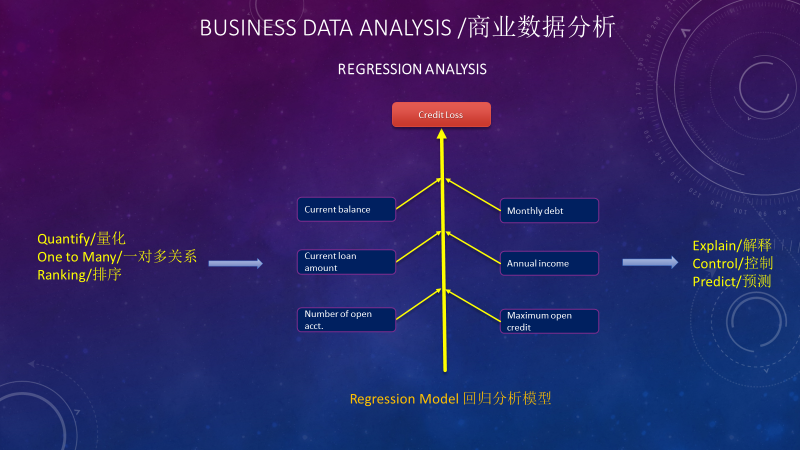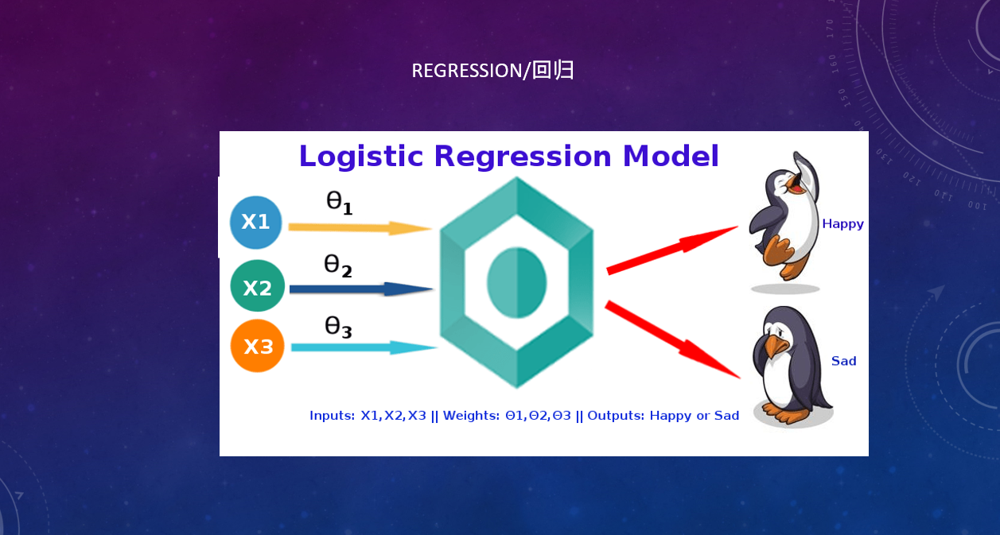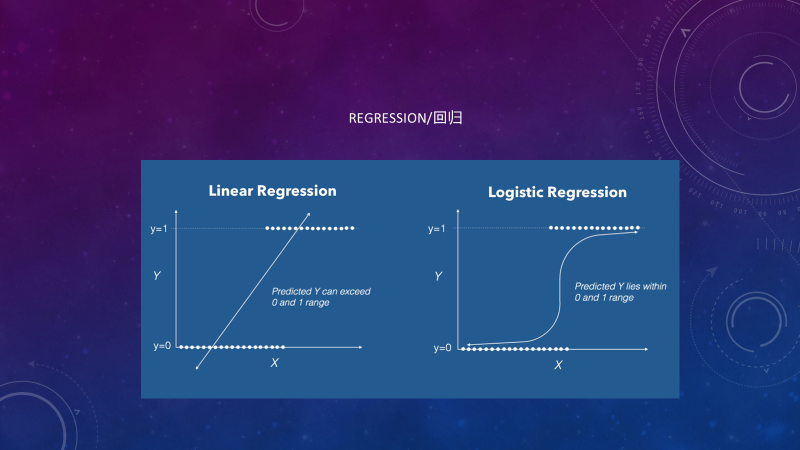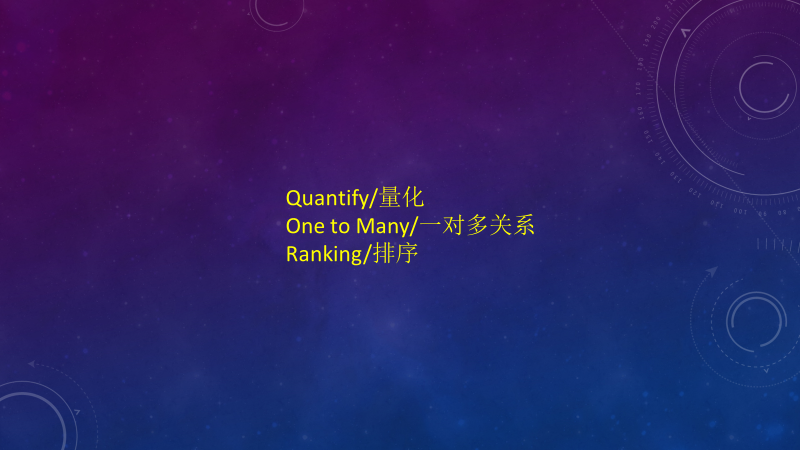

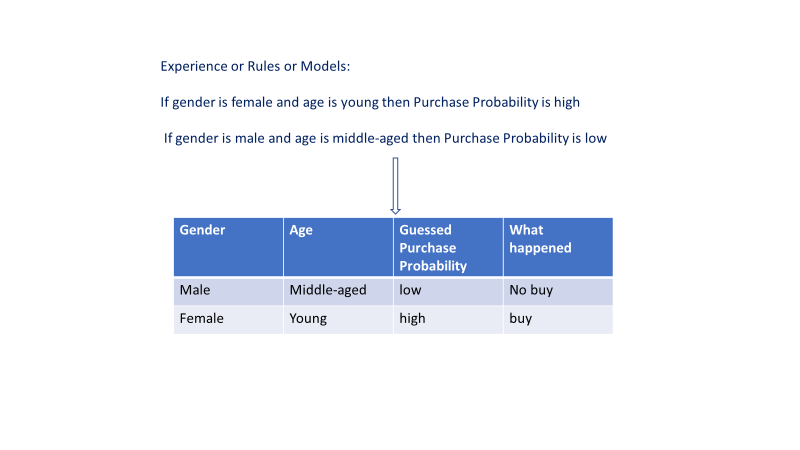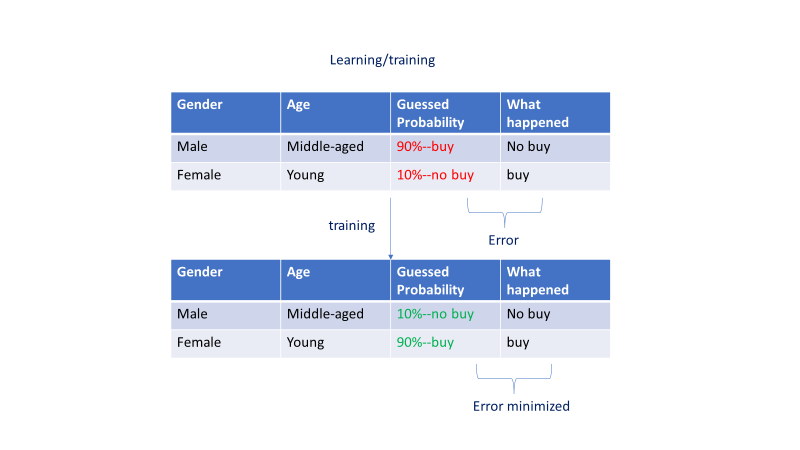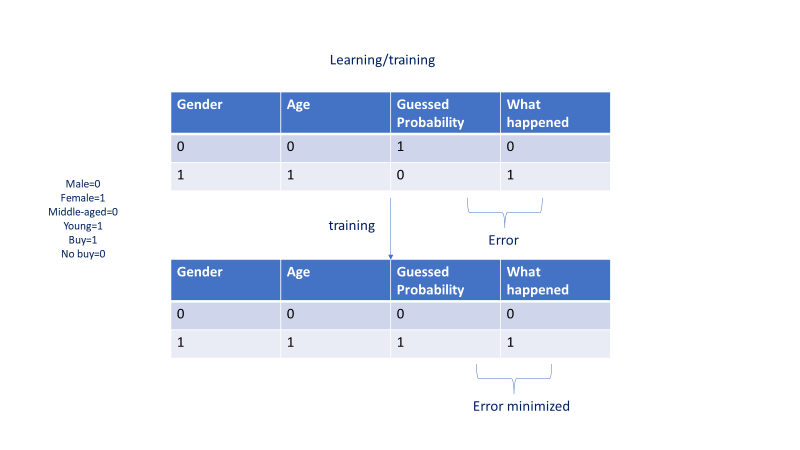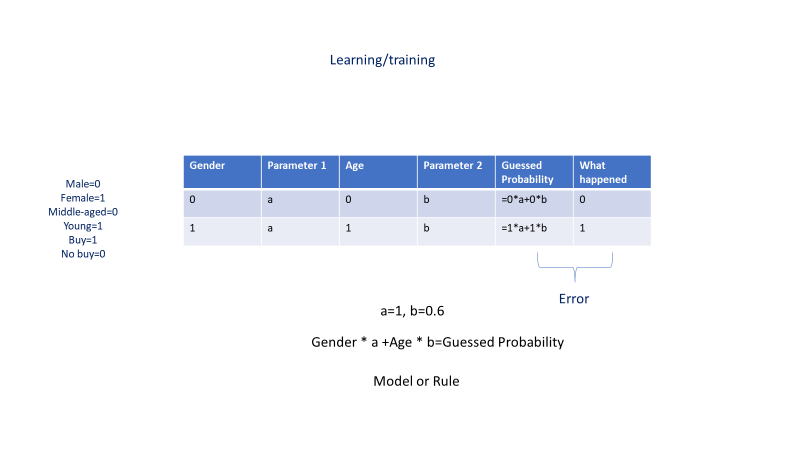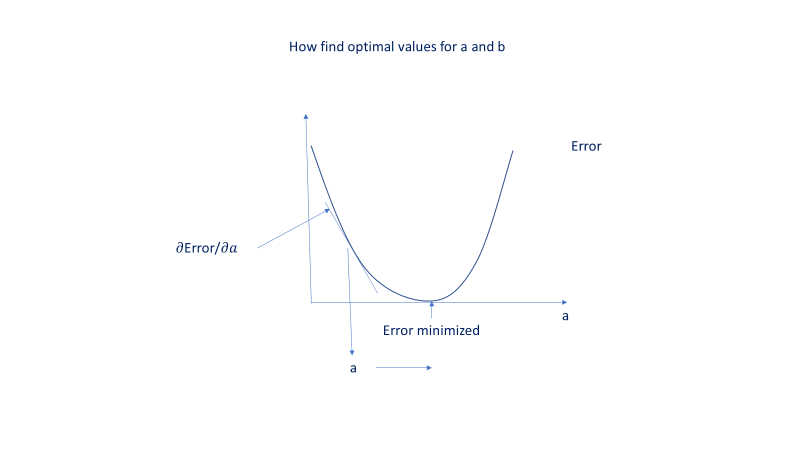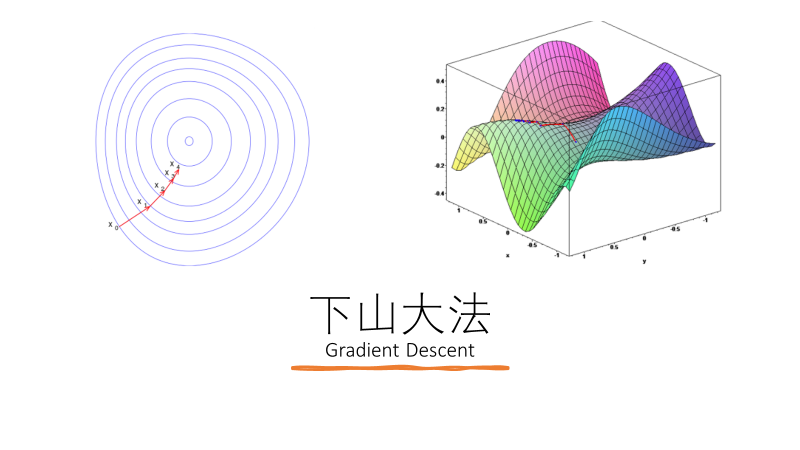

### Machine Learning steps:
### a,Feature Selection
### b, Algorithm Selection
### c, Hyperparameter Tuning
### d, Model Training
### e, Model Performance

# 4,Model visulization

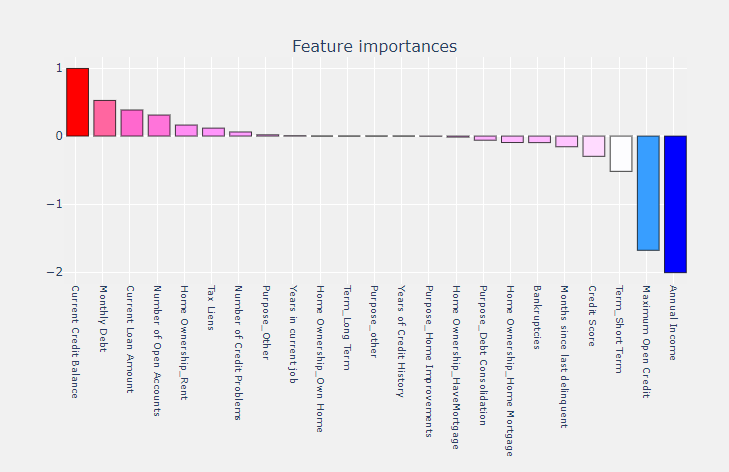